### These plots will compare various Microphysics Models to the baseline model

718


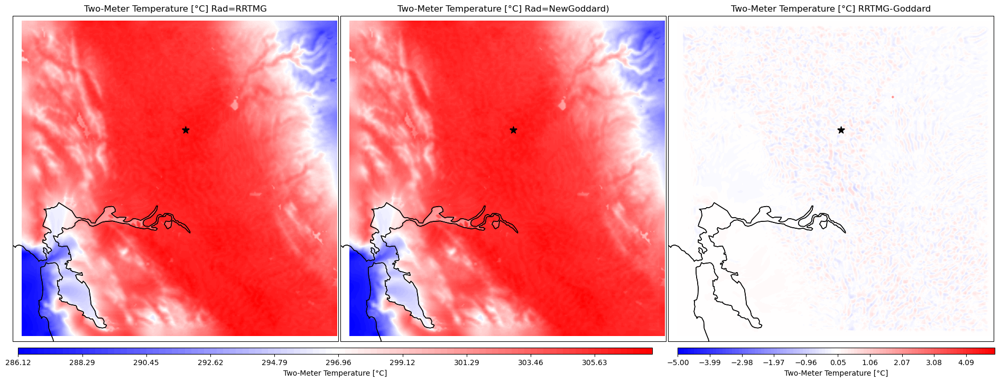

In [1]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob

## Load the Input Files
ncfile0 = Dataset("/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD4_251118/wrfout_d01_2020-06-30_21:00:00")
ncfile1 = Dataset("/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD5_251119/wrfout_d01_2020-06-30_21:00:00")
#ncfile2 = Dataset("/data/wto/WRF/WRFV4.5/test/em_real_PBL5/wrfout_d01_2020-06-23_21:00:00")
EPAVar = (np.loadtxt("/data/wto/EPAMetData/hourly_TEMP_2020_06_Sac.csv", delimiter=',',usecols=[13])-32)*5/9
print(len(EPAVar))

## User Parameters
### Set the Variable you want to look at. ####
Var = "T2"
VarLabel = "Two-Meter Temperature [°C]"

### Grab the Variables, long, lats and projections.
Var0 = getvar(ncfile0, Var)
wrf_proj = get_cartopy(Var0)
lats, lons = latlon_coords(Var0)
#Var0=Var0-273.15
Var1 = getvar(ncfile1, Var)
#Var1=Var1-273.15

# Create figure with minimal whitespace
fig, (ax0, ax1, ax2) = plt.subplots(1, 3, subplot_kw={'projection': wrf_proj}, 
                               gridspec_kw={'wspace': -0.0}, figsize=(24, 8))

# Add shared colorbar spanning only the width of both plots
levels = np.linspace(np.min([to_np(Var0).min(),to_np(Var1).min()]),
                     np.max([to_np(Var0).max(),to_np(Var1).max()]), 100)

#  contour plot for UCM=0
ax0.set_title(VarLabel+ " Rad=RRTMG")
ax0.set_extent([to_np(lons).min(), to_np(lons).max(), to_np(lats).min(), to_np(lats).max()], crs=cp.crs.PlateCarree())
center_lon, center_lat = -121.49, 38.58
lon_min, lon_max = center_lon - 0.3, center_lon + 0.3
lat_min, lat_max = center_lat - 0.25, center_lat + 0.25
#ax0.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cp.crs.PlateCarree())
contour0 = ax0.contourf(to_np(lons), to_np(lats),to_np(Var0),transform=cp.crs.PlateCarree(), cmap="bwr",levels=levels) 
# Add geographical features and a star marker for Sacramento
ax0.add_feature(cp.feature.COASTLINE)
ax0.add_feature(cp.feature.STATES)
ax0.scatter(-121.49, 38.58, color='black', marker='*', s=100, label="Sacramento",transform=cp.crs.PlateCarree())


#  contour plot for UCM=1 
ax1.set_title(VarLabel+ " Rad=NewGoddard)")
ax1.set_extent([to_np(lons).min(), to_np(lons).max(), to_np(lats).min(), to_np(lats).max()], crs=cp.crs.PlateCarree())
#ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cp.crs.PlateCarree())
contour1 = ax1.contourf(to_np(lons), to_np(lats), to_np(Var1),transform=cp.crs.PlateCarree(), cmap="bwr",levels=levels) 
# Add geographical features and a star marker for Sacramento
ax1.add_feature(cp.feature.COASTLINE)
ax1.add_feature(cp.feature.STATES)
ax1.scatter(-121.49, 38.58, color='black', marker='*', s=100, label="Sacramento",transform=cp.crs.PlateCarree())

cbar_ax1 = fig.add_axes([0.13, 0.08, 0.5, 0.015])  # [left, bottom, width, height]
cbar1 = fig.colorbar(contour0, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label(VarLabel)

#  contour plot for UCM= (1-0)
ax2.set_title(VarLabel+ " RRTMG-Goddard")
ax2.set_extent([to_np(lons).min(), to_np(lons).max(), to_np(lats).min(), to_np(lats).max()], crs=cp.crs.PlateCarree())
contour2 = ax2.contourf(to_np(lons), to_np(lats), to_np(Var1)-to_np(Var0),transform=cp.crs.PlateCarree(), cmap="bwr",levels=np.linspace(-5,5,100)) 
# Add geographical features and a star marker for Sacramento
ax2.add_feature(cp.feature.COASTLINE)
ax2.add_feature(cp.feature.STATES)
ax2.scatter(-121.49, 38.58, color='black', marker='*', s=100, label="Sacramento",transform=cp.crs.PlateCarree())
# Add shared colorbar spanning only the width of both plots
cbar_ax2 = fig.add_axes([0.65, 0.08, 0.25, 0.015])  # [left, bottom, width, height]
cbar2 = fig.colorbar(contour2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label(VarLabel)

plt.show()

## EPA Sensor Location
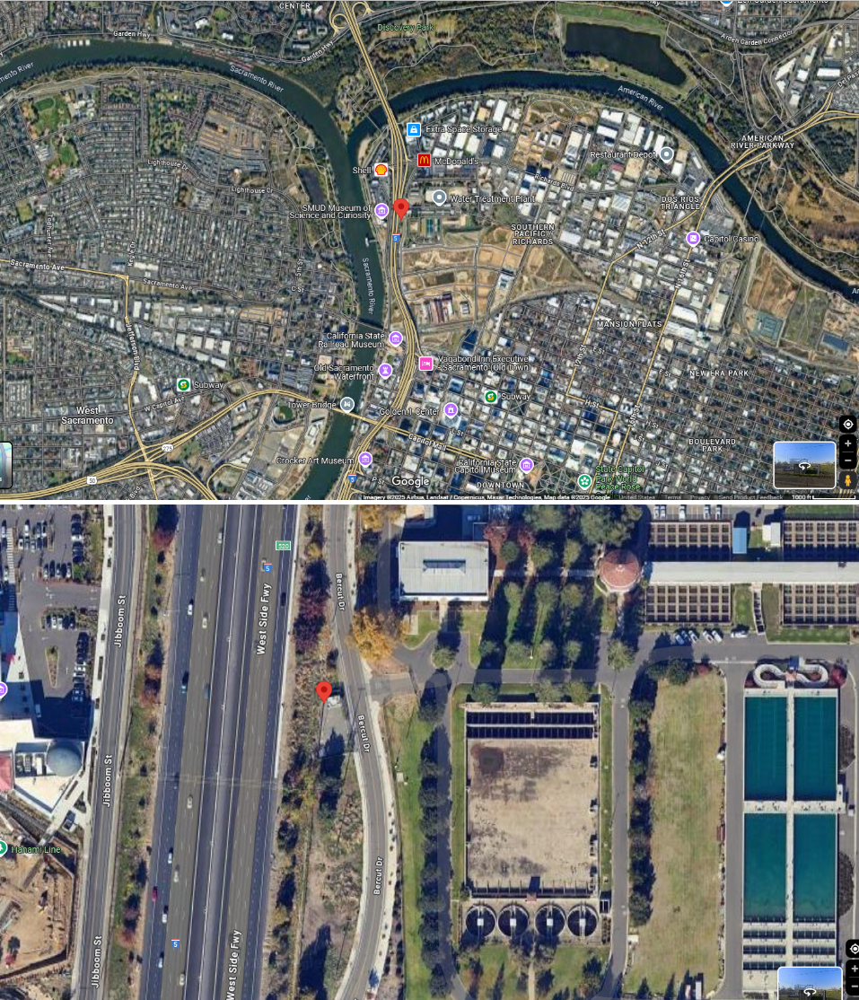


### Compare the Models to EPA Data in Sacramento.

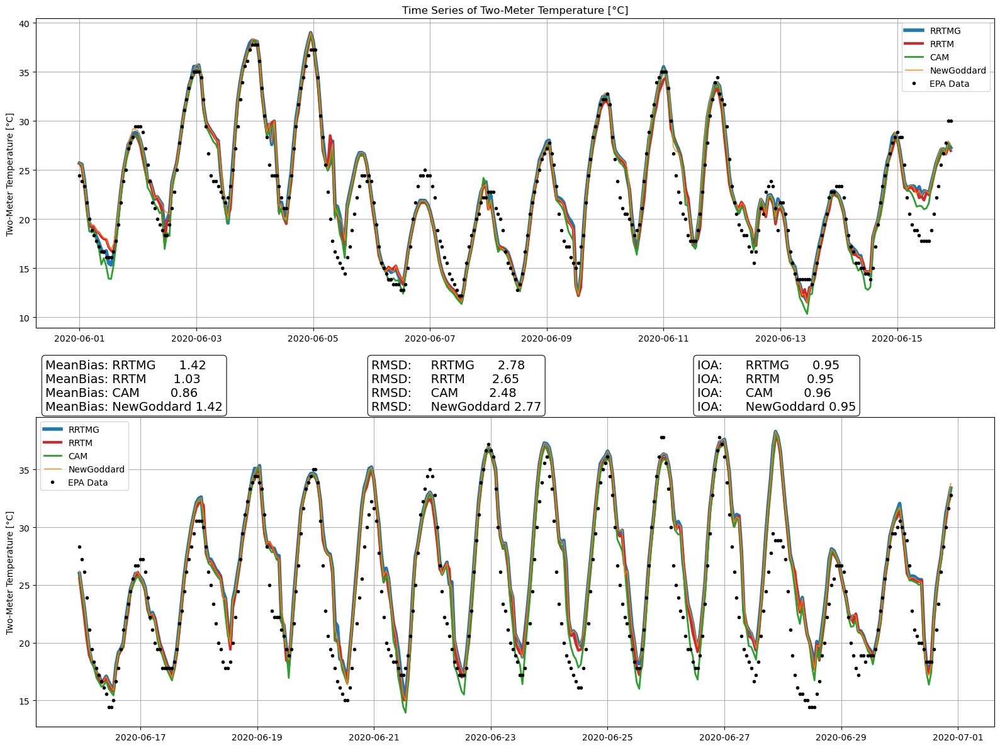

[[1.4159006083945311, 1.0338938489634943, 0.8552388036852692, 1.424981840577026], [2.7818365715015942, 2.6503668917267453, 2.481226578016311, 2.7687892358786907], [0.9503744376247267, 0.9541014029884463, 0.9611048619964174, 0.9508407481326222]]


In [2]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "T2"
Title = "Time Series of Two-Meter Temperature [°C]"
YLabel = "Two-Meter Temperature [°C]"
lat_point = 37.689
lon_point = -121.4415
## Load the EPA Data Input File
DataVal = (np.loadtxt("/data/wto/EPAMetData/hourly_TEMP_2020_06_Sac.csv", delimiter=',',usecols=[13])-32)*5/9
#print(len(DataVal))

# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD4_251118/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD1_251120/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD3_251121/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD5_251119/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point, offset=-273.15)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","RRTMG","RRTM","CAM","NewGoddard"],Show=True)
print(results)

In [ ]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "rh2"
Title = "Time Series of Relative Humidity [%]"
YLabel = "Relative Humidity [%]"
lat_point = 38.56844
lon_point = -121.49311
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_RH_DP_2020_06_Sac.csv", delimiter=',',usecols=[13],max_rows=718)
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD4_251118/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD1_251120/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD3_251121/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD5_251119/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","RRTMG","RRTM","CAM","NewGoddard"],Show=True)
print(results)

In [ ]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "wspd10"
Title = "Time Series of Wind Magnitude [m/s]"
YLabel = "Wind Magnitude [m/s]"
lat_point = 38.593322
lon_point = -121.503795
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_WINDMAG_2020_06_Sac.csv", delimiter=',',usecols=[13],max_rows=718)*0.514444
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD4_251118/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD1_251120/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD3_251121/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD5_251119/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","RRTMG","RRTM","CAM","NewGoddard"],Show=True)
print(results)

In [ ]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "wdir10"
Title = "Time Series of Wind Dir [Degrees]"
YLabel = "Wind Dir [Degrees]"
lat_point = 38.593322
lon_point = -121.503795
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_WINDDIR_2020_06_Sac.csv", delimiter=',',usecols=[13],max_rows=718)
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD4_251118/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD1_251120/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD3_251121/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD5_251119/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","RRTMG","RRTM","CAM","NewGoddard"],Show=True)
print(results)

### Lets look at another location.
Lat,Long = 38.302591,-121.420838<br>
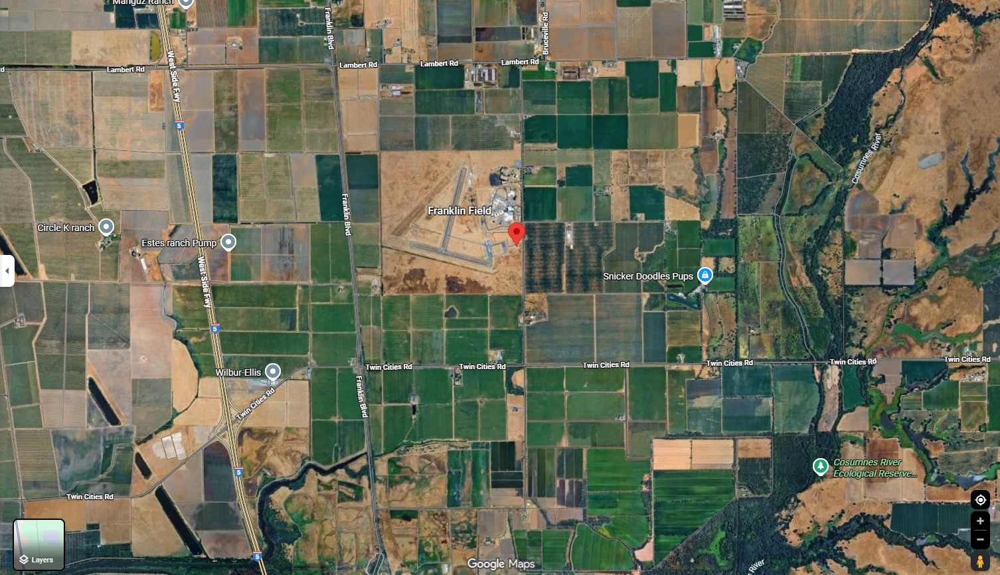

In [ ]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "T2"
Title = "Time Series of Two-Meter Temperature [°C]"
YLabel = "Two-Meter Temperature [°C]"
lat_point = 38.302591
lon_point = -121.420838
## Load the EPA Data Input File
DataVal = (np.loadtxt("/data/wto/EPAMetData/hourly_TEMP_2020_06_Franklin.csv", delimiter=',',usecols=[13],max_rows=718)-32)*5/9
#print(len(DataVal))

# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD4_251118/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD1_251120/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD3_251121/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD5_251119/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point, offset=-273.15)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","RRTMG","RRTM","CAM","NewGoddard"],Show=True)
print(results)

In [ ]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "rh2"
Title = "Time Series of Relative Humidity [%]"
YLabel = "Relative Humidity [%]"
lat_point = 38.302591
lon_point = -121.420838
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_RH_DP_2020_06_Franklin.csv", delimiter=',',usecols=[13],max_rows=718)
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD4_251118/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD1_251120/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD3_251121/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD5_251119/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","RRTMG","RRTM","CAM","NewGoddard"],Show=True)
print(results)

In [ ]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "wspd10"
Title = "Time Series of Wind Magnitude [m/s]"
YLabel = "Wind Magnitude [m/s]"
lat_point = 38.302591
lon_point = -121.420838
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_WINDMAG_2020_06_Franklin.csv", delimiter=',',usecols=[13],max_rows=718)*0.514444
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD4_251118/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD1_251120/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD3_251121/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD5_251119/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","RRTMG","RRTM","CAM","NewGoddard"],Show=True)
print(results)

In [ ]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "wdir10"
Title = "Time Series of Wind Dir [Degrees]"
YLabel = "Wind Dir [Degrees]"
lat_point = 38.302591
lon_point = -121.420838
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_WINDDIR_2020_06_Franklin.csv", delimiter=',',usecols=[13],max_rows=718)
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD4_251118/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD1_251120/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD3_251121/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_RAD5_251119/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","RRTMG","RRTM","CAM","NewGoddard"],Show=True)
print(results)

### Station Half a Mile South of the Capitol.
Lat,Long = 38.56844,-121.49311 <br>
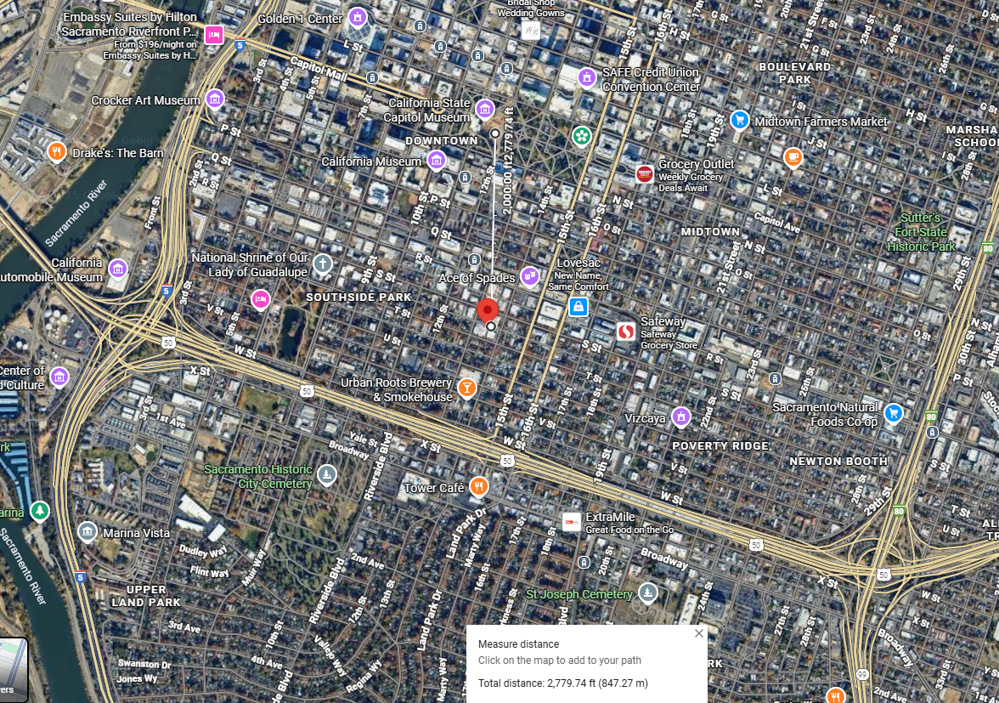

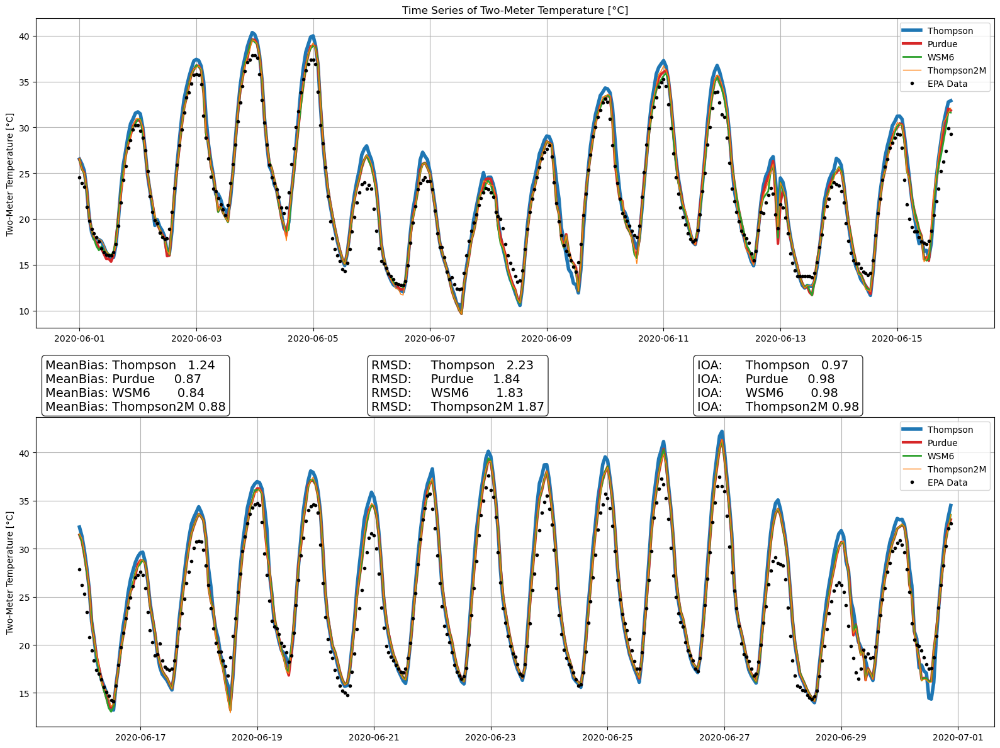

[[1.2366518918518465, 0.8678125748063423, 0.841561209591009, 0.8791947813751533], [2.2285996715991216, 1.8381863497546425, 1.8279307002085898, 1.868508666387843], [0.9742920030582937, 0.9814442262904016, 0.9816246133130548, 0.9809245874571546]]


In [20]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "T2"
Title = "Time Series of Two-Meter Temperature [°C]"
YLabel = "Two-Meter Temperature [°C]"
lat_point = 38.56844
lon_point = -121.49311
## Load the EPA Data Input File
DataVal = (np.loadtxt("/data/wto/EPAMetData/hourly_TEMP_2020_06_SacSoCap.csv", delimiter=',',usecols=[13],max_rows=718)-32)*5/9
#print(len(DataVal))

# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_250711/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP2_250805/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_250730/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP38_250804/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point,offset=-273.15)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","Thompson","Purdue","WSM6","Thompson2M"],Show=True)
print(results)

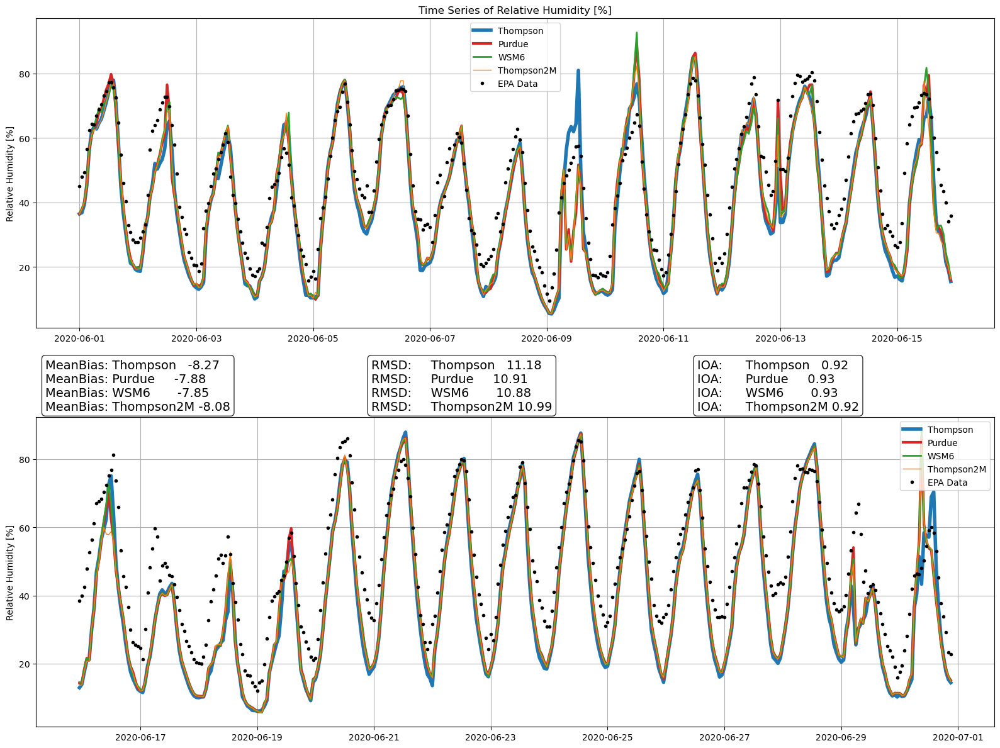

[[-8.268562664361387, -7.882816392531967, -7.849587961956652, -8.083159458803268], [11.182753131337925, 10.90945011665661, 10.879243887294386, 10.994417535289921], [0.9232426442835903, 0.9254188272067263, 0.9255755872342829, 0.923808327490838]]


In [12]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "rh2"
Title = "Time Series of Relative Humidity [%]"
YLabel = "Relative Humidity [%]"
lat_point = 38.56844
lon_point = -121.49311
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_RH_DP_2020_06_SacSoCap.csv", delimiter=',',usecols=[13],max_rows=718)
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_250711/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP2_250805/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_250730/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP38_250804/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","Thompson","Purdue","WSM6","Thompson2M"],Show=True)
print(results)

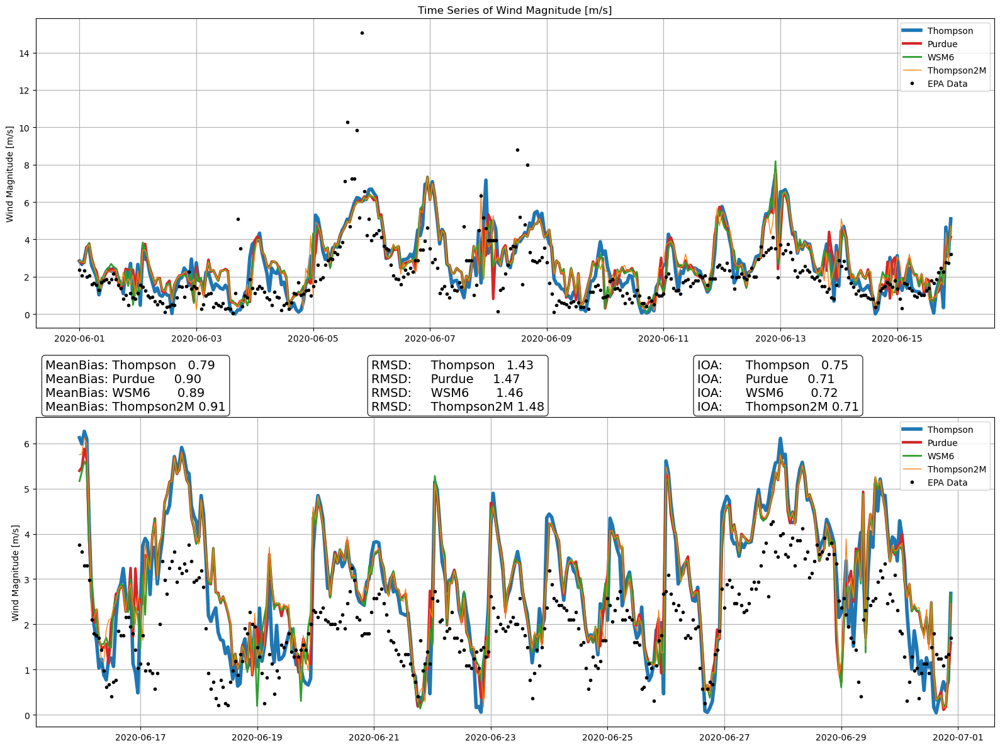

[[0.7934957400755692, 0.9004415968008993, 0.891754960031767, 0.9145809971342315], [1.4321987697928444, 1.4707601719148269, 1.4636816032324846, 1.4798122960402935], [0.7494256218655202, 0.7145941954885813, 0.716119270927581, 0.7144992965383654]]


In [13]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "wspd10"
Title = "Time Series of Wind Magnitude [m/s]"
YLabel = "Wind Magnitude [m/s]"
lat_point = 38.56844
lon_point = -121.49311
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_WINDMAG_2020_06_SacSoCap.csv", delimiter=',',usecols=[13],max_rows=718)*0.514444
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_250711/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP2_250805/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_250730/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP38_250804/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","Thompson","Purdue","WSM6","Thompson2M"],Show=True)
print(results)

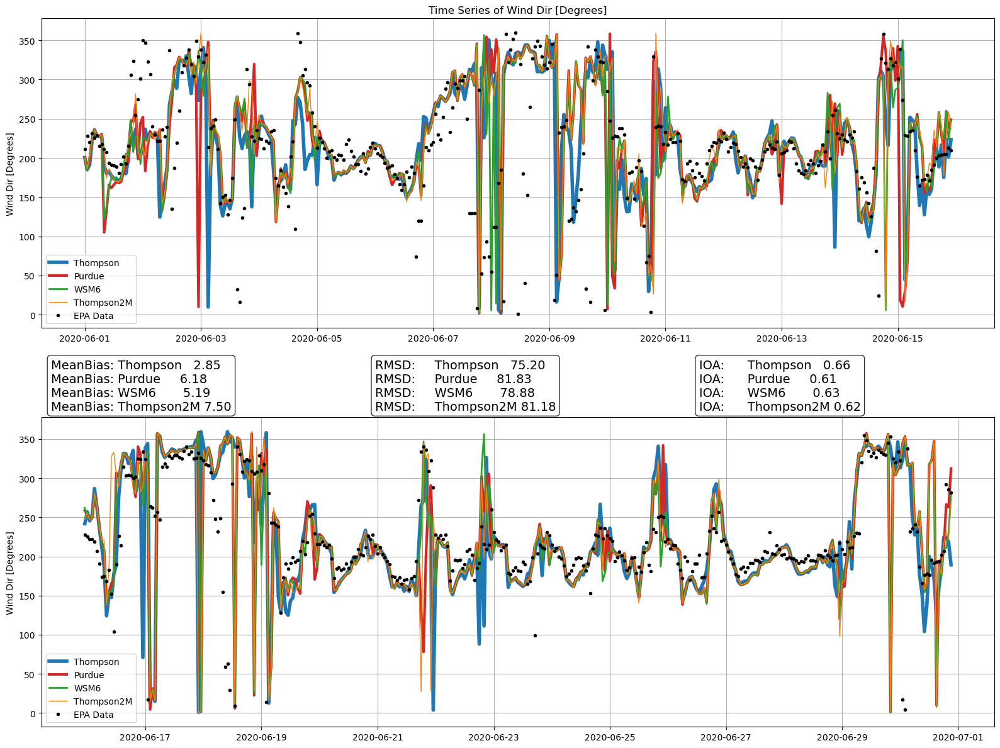

[[2.847554450164598, 6.17939515183563, 5.187042251104764, 7.502288859161162], [75.19698869547855, 81.82893647540189, 78.87647367103138, 81.1796615086081], [0.6559121643264108, 0.6122370143005347, 0.6332691374816213, 0.6193140862558454]]


In [14]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "wdir10"
Title = "Time Series of Wind Dir [Degrees]"
YLabel = "Wind Dir [Degrees]"
lat_point = 38.56844
lon_point = -121.49311
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_WINDDIR_2020_06_SacSoCap.csv", delimiter=',',usecols=[13],max_rows=718)
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_250711/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP2_250805/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_250730/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP38_250804/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","Thompson","Purdue","WSM6","Thompson2M"],Show=True)
print(results)

### Station 12km East of the Capitol in Arden Arcade.
Lat, Long = 38.613779,-121.368014 <br>
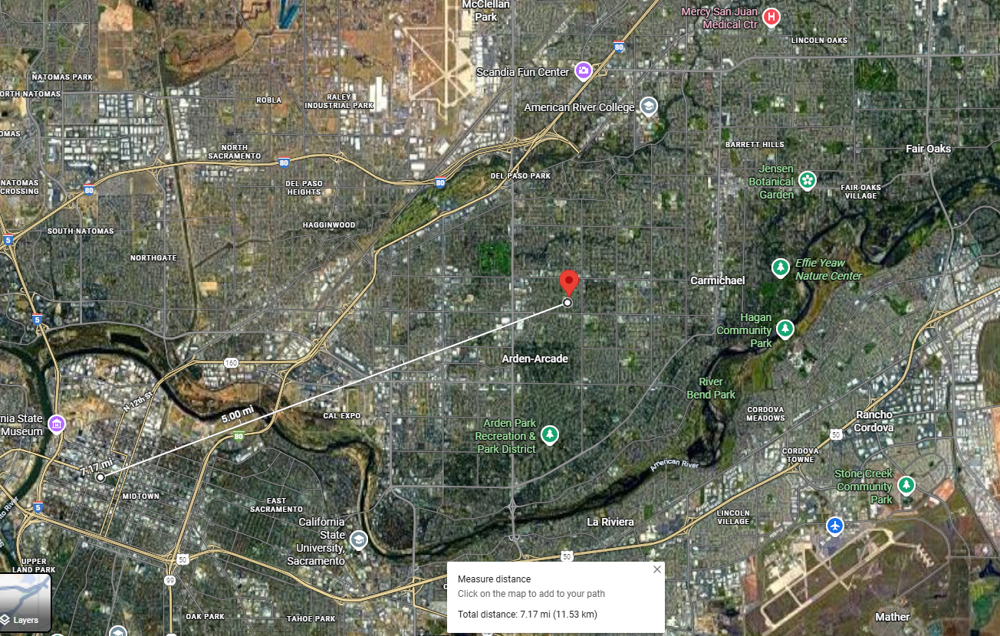

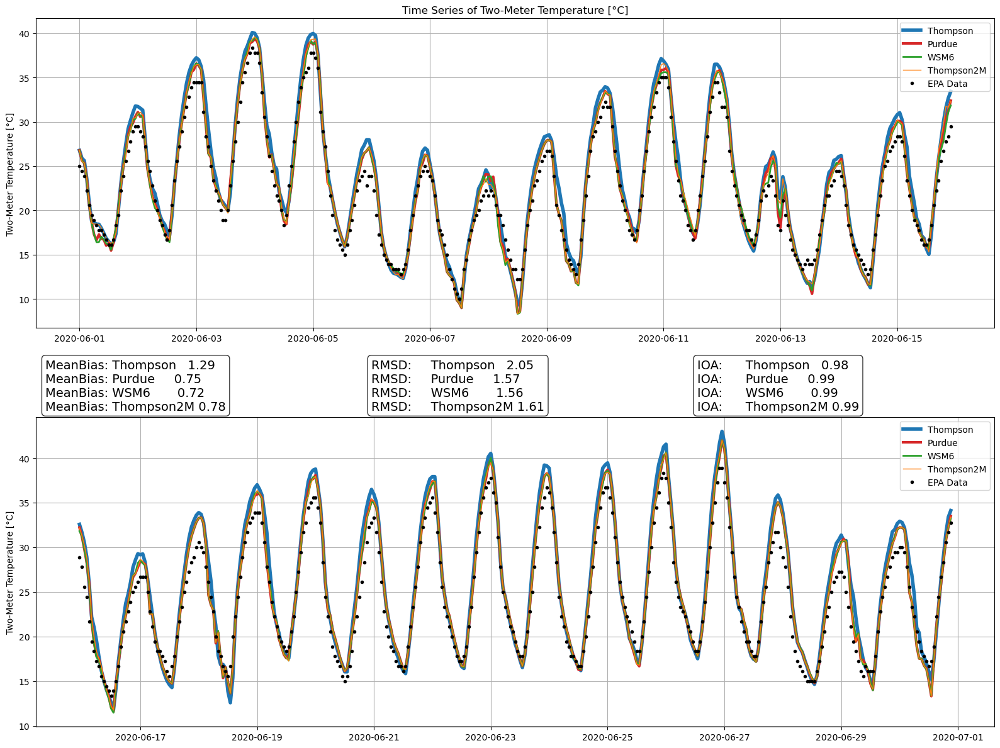

[[1.2865171328007352, 0.7462320595177441, 0.7235771781333646, 0.779861283014545], [2.0538081276781592, 1.5745526054595067, 1.5605142580575992, 1.6078120719963753], [0.9788578909533274, 0.9870060695906143, 0.9872162359590331, 0.9864846982102572]]


In [19]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "T2"
Title = "Time Series of Two-Meter Temperature [°C]"
YLabel = "Two-Meter Temperature [°C]"
lat_point = 38.613779
lon_point = -121.368014
## Load the EPA Data Input File
DataVal = (np.loadtxt("/data/wto/EPAMetData/hourly_TEMP_2020_06_ArdenArcade.csv", delimiter=',',usecols=[13],max_rows=718)-32)*5/9
#print(len(DataVal))

# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_250711/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP2_250805/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_250730/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP38_250804/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point,offset=-273.15)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","Thompson","Purdue","WSM6","Thompson2M"],Show=True)
print(results)

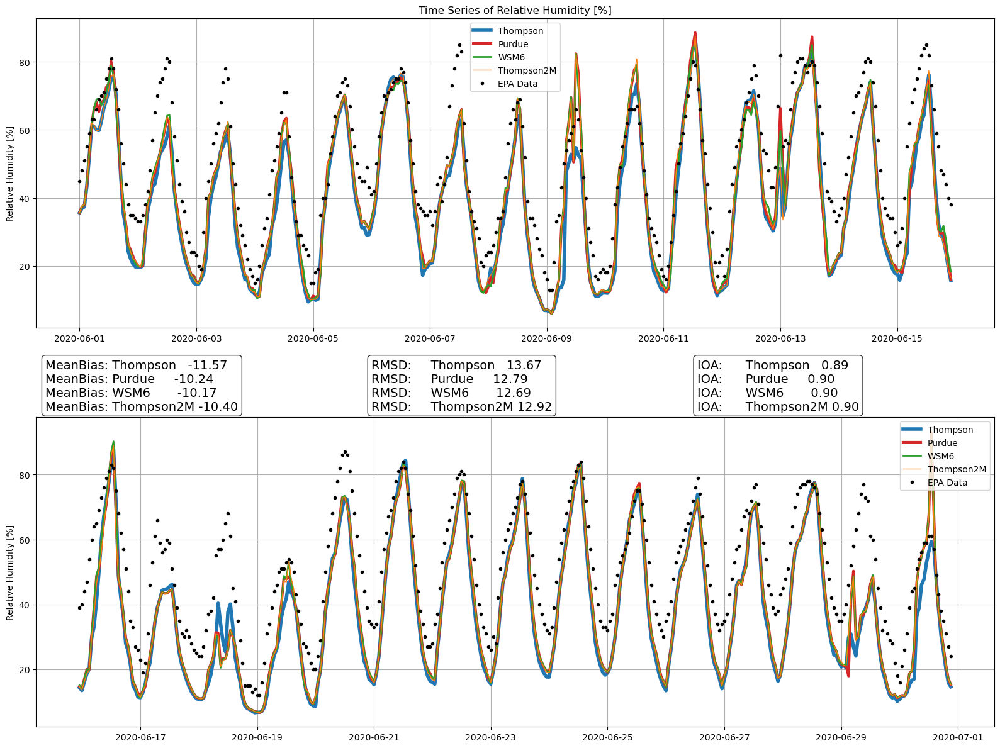

[[-11.56701052288491, -10.242551895901354, -10.171296333536132, -10.402064355967104], [13.668149919315821, 12.78962397497778, 12.691287343624962, 12.923619865242154], [0.8893957724575179, 0.9016985045571507, 0.9028256737267507, 0.8992718771182101]]


In [16]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "rh2"
Title = "Time Series of Relative Humidity [%]"
YLabel = "Relative Humidity [%]"
lat_point = 38.613779
lon_point = -121.368014
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_RH_DP_2020_06_ArdenArcade.csv", delimiter=',',usecols=[13],max_rows=718)
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_250711/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP2_250805/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_250730/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP38_250804/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","Thompson","Purdue","WSM6","Thompson2M"],Show=True)
print(results)

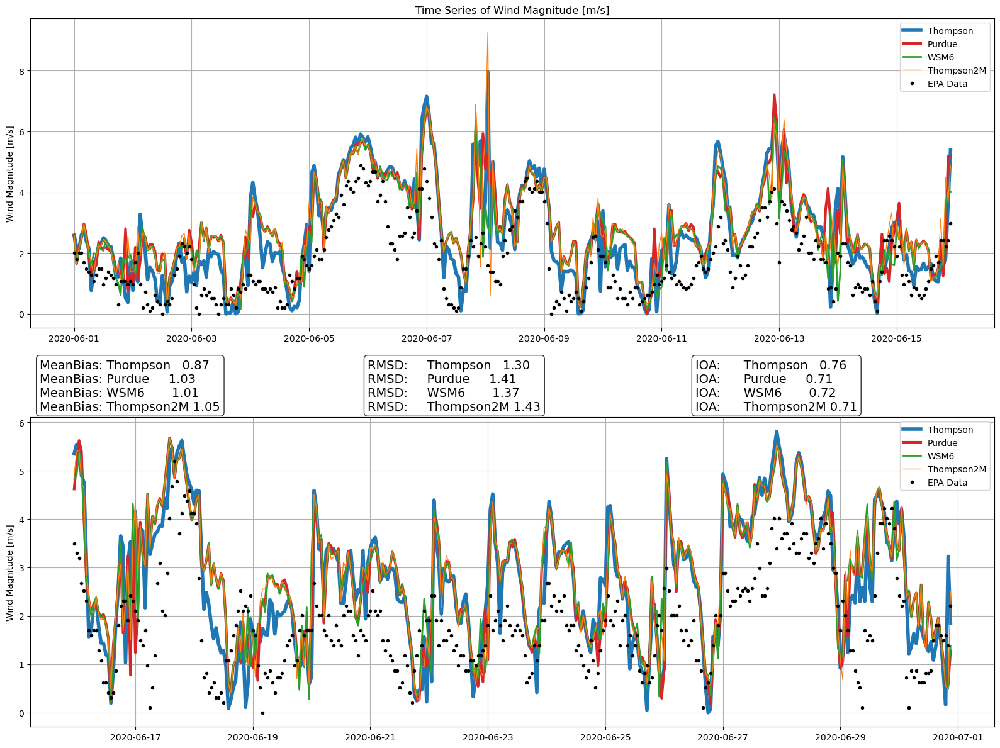

[[0.8727694815989144, 1.02958887446559, 1.0096785302627402, 1.0540552980817146], [1.3008002843914939, 1.410857522779936, 1.3724615672723817, 1.4317935751403703], [0.7620507401578654, 0.7124524838053578, 0.7205194168885724, 0.7066223865589976]]


In [17]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "wspd10"
Title = "Time Series of Wind Magnitude [m/s]"
YLabel = "Wind Magnitude [m/s]"
lat_point = 38.613779
lon_point = -121.368014
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_WINDMAG_2020_06_ArdenArcade.csv", delimiter=',',usecols=[13],max_rows=718)*0.514444
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_250711/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP2_250805/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_250730/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP38_250804/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","Thompson","Purdue","WSM6","Thompson2M"],Show=True)
print(results)

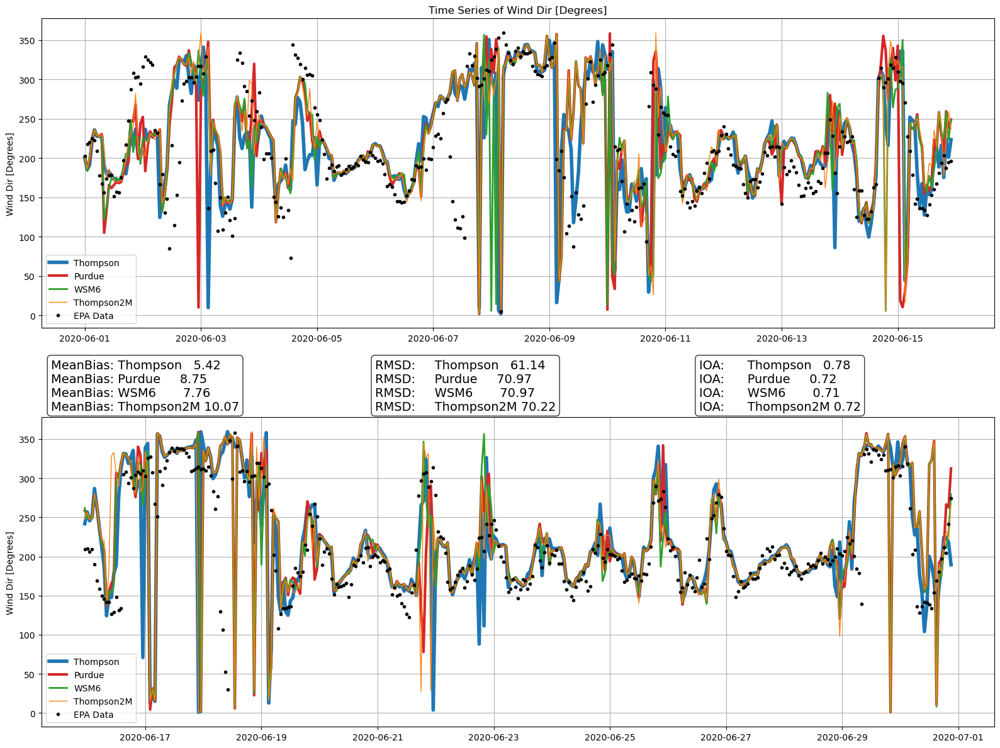

[[5.419281469663204, 8.751122171334236, 7.75876927060337, 10.074015878659768], [61.14446220783501, 70.9737620088793, 70.97426409754075, 70.21933596121377], [0.7806739770803769, 0.7171010233486499, 0.7112288931490061, 0.722269431023752]]


In [18]:
## Loading the Libaries.
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, to_np, get_cartopy, latlon_coords, ll_to_xy, vertcross, interplevel,ALL_TIMES
import cartopy as cp
from glob import glob
from PyWRFFun import MonthTimeSeries, MonthGlob

# === Inputs ===
Var = "wdir10"
Title = "Time Series of Wind Dir [Degrees]"
YLabel = "Wind Dir [Degrees]"
lat_point = 38.56844
lon_point = -121.49311
## Load the EPA Data Input File
DataVal = np.loadtxt("/data/wto/EPAMetData/hourly_WINDDIR_2020_06_ArdenArcade.csv", delimiter=',',usecols=[13],max_rows=718)
# === Get monthly WRF Values ===
WRFFiles = ["/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_250711/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP2_250805/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP6_250730/wrfout_d01_2020-06-*",
            "/data/wto/WRFOUT/Sac_NDown_UCM1_PBL5_FDDA1_MP38_250804/wrfout_d01_2020-06-*"]
Time, Vals = MonthGlob(WRFFiles, Var, lat_point, lon_point)
# Concatenate the Data and WRF Values The [] around DataVal is needed to make sure it adds the array into the list.
Vals = [DataVal] + Vals
# === Call MonthTimeSeries plot function ===
results = MonthTimeSeries(Time,Vals,Title,YLabel, ["EPA Data","Thompson","Purdue","WSM6","Thompson2M"],Show=True)
print(results)